# Testing of fetching album art

In [3]:
import album_art

# Import the album_art module and test embedding cover art

# Test with a sample artist and album
test_artist = "Heavenly"
test_album = "Portland Town"
test_mp3_path = "NeuralForge/songs/Power Metal/Heavenly - Portland Town.mp3"  # This would be your actual MP3 file path

[show] Loading ID3 from: NeuralForge/songs/Power Metal/Sabaton - Bismarck.mp3
[show] Found 1 APIC frame(s).
[show] Selected APIC type=PictureType.COVER_FRONT, MIME=image/jpeg
[show] Displaying image (format=jpeg, fixed width=400)...


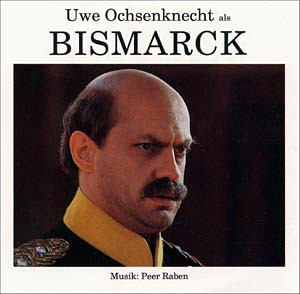

Saved embedded art to: /tmp/tmpsrtvgx8t.jpeg


'image/jpeg'

In [4]:
album_art.show_embedded_art(test_mp3_path)

In [5]:
print(f"Testing album art embedding for '{test_album}' by '{test_artist}'")
album_art.embed_from_artist_album(test_mp3_path, test_artist, test_album)

Testing album art embedding for 'Bismarck' by 'Sabaton'
Searching for album 'Bismarck' by 'Sabaton' on MusicBrainz...
-> Candidate release 'Bismarck' (ID: b487d533-0816-4f04-ba81-5b13a86c1b9e) [score=163.0, date=2019-05-17, country=XW, sources=release-search, status=Official]
-> Successfully downloaded cover art from http://coverartarchive.org/release/b487d533-0816-4f04-ba81-5b13a86c1b9e/23312714655.jpg
-> Successfully embedded artwork into 'NeuralForge/songs/Power Metal/Sabaton - Bismarck.mp3' (Release: 'Bismarck')


[show] Loading ID3 from: NeuralForge/songs/Power Metal/Sabaton - Bismarck.mp3
[show] Found 1 APIC frame(s).
[show] Selected APIC type=PictureType.COVER_FRONT, MIME=image/jpeg
[show] Displaying image (format=jpeg, fixed width=400)...


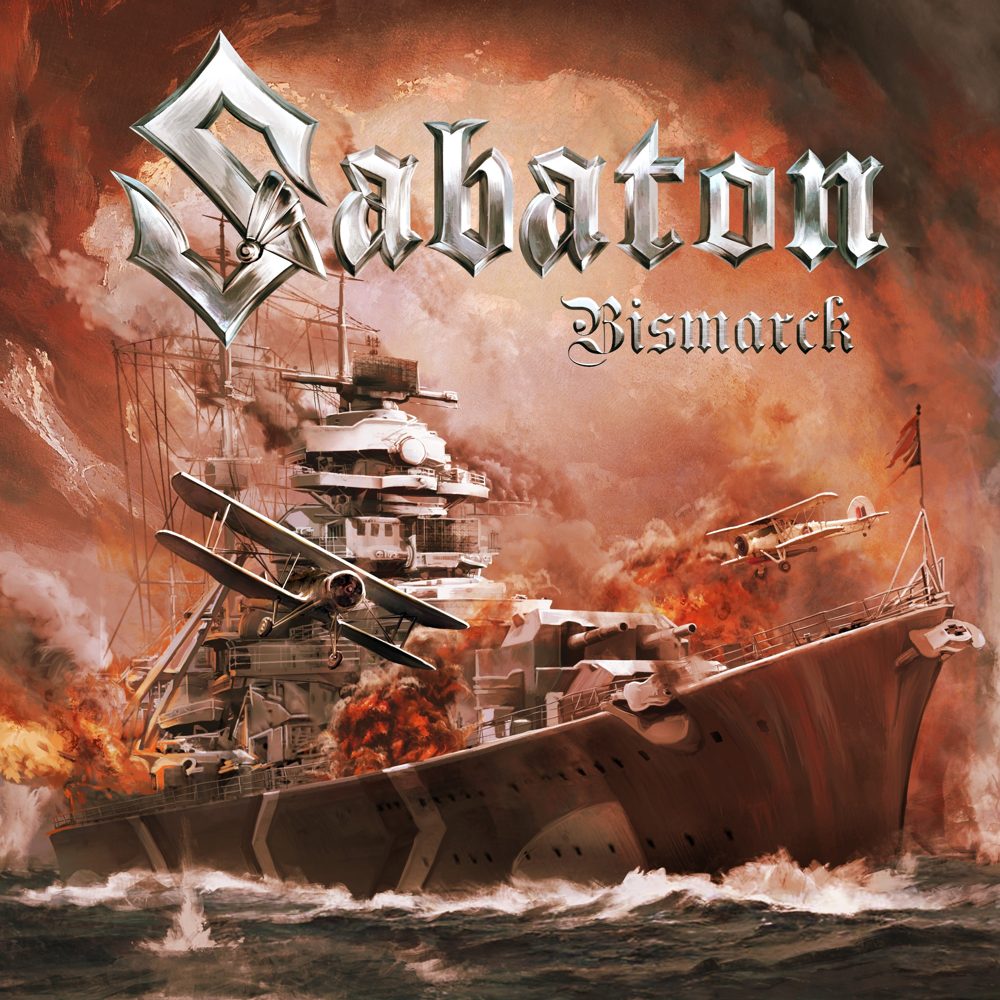

Saved embedded art to: /tmp/tmpilj9kfow.jpeg


'image/jpeg'

In [6]:
album_art.show_embedded_art(test_mp3_path)

# Apply to all of a Playlist

In [5]:
import os
from mutagen.easyid3 import EasyID3
from tqdm.auto import tqdm
import album_art

# Loop through all MP3 files in the Melodic Death Metal folder
playlist_path = "NeuralForge/songs/Power Metal"

neuralforge_playlists = [
    # "NeuralForge/songs/Classic Metal",
    # "NeuralForge/songs/Folk Metal",
    "NeuralForge/songs/Folk Rock",
    "NeuralForge/songs/New Releases",
    "NeuralForge/songs/Prog Metal",
    # "NeuralForge/songs/Melodic Death Metal",
    # "NeuralForge/songs/Power Metal",
]

for playlist_dir in neuralforge_playlists:
    for root, dirs, files in os.walk(playlist_dir):
        mp3_files = [f for f in files if f.lower().endswith(".mp3")]

        for file in tqdm(
            mp3_files, desc=f"Processing {os.path.basename(playlist_dir)}"
        ):
            file_path = os.path.join(root, file)

            # Extract artist and album from MP3 tags
            audio = EasyID3(file_path)
            artist = audio.get("artist", ["Unknown Artist"])[0]
            album = audio.get("album", ["Unknown Album"])[0]

            print(f"\n---------------------")
            print(f"Processing: {artist} - {album}")

            # Embed album art
            album_art.embed_from_artist_album(file_path, artist, album)

Processing Folk Rock:   0%|          | 0/90 [00:00<?, ?it/s]


---------------------
Processing: The Pogues - Rum Sodomy & the Lash
Searching for album 'Rum Sodomy & the Lash' by 'The Pogues' on MusicBrainz...
-> Candidate release 'Rum Sodomy & the Lash' (ID: 27ba4f0d-69c6-4228-8049-8fa58df34ae7) [score=173.0, date=1985, country=FR, sources=release-group,release-search, status=Official]
-> Successfully downloaded cover art from http://coverartarchive.org/release/27ba4f0d-69c6-4228-8049-8fa58df34ae7/15997321241.jpg
-> Successfully embedded artwork into 'NeuralForge/songs/Folk Rock/The Pogues - Dirty Old Town.mp3' (Release: 'Rum Sodomy & the Lash')

---------------------
Processing: Flogging Molly - Drunken Lullabies
Searching for album 'Drunken Lullabies' by 'Flogging Molly' on MusicBrainz...
-> Candidate release 'Drunken Lullabies' (ID: 2fc9a409-48e2-32f0-b513-77df11a873c7) [score=173.0, date=2002-03-19, country=US, sources=release-group,release-search, status=Official]
-> Successfully downloaded cover art from http://coverartarchive.org/release/

Processing New Releases:   0%|          | 0/93 [00:00<?, ?it/s]


---------------------
Processing: Sabaton - Crossing the Rubicon (feat. NOTHING MORE)
Searching for album 'Crossing the Rubicon (feat. NOTHING MORE)' by 'Sabaton' on MusicBrainz...
-> No high-confidence release candidates found; falling back to legacy logic.
-> No exact (case-insensitive) title match found (legacy fallback).
-> Failed to embed cover art after trying available candidates.

---------------------
Processing: Alestorm - Gardyloo
Searching for album 'Gardyloo' by 'Alestorm' on MusicBrainz...
-> Candidate release 'Gardyloo' (ID: 90ff8a3e-93ed-4e68-8b2b-14da13bcc4a5) [score=133.0, date=2025-07-24, country=XW, sources=release-search, status=Official]
-> Cover Art Archive metadata not available for release 90ff8a3e-93ed-4e68-8b2b-14da13bcc4a5: caused by: HTTP Error 404: NOT FOUND
-> Failed to download cover art: 404 Client Error: NOT FOUND for url: https://coverartarchive.org/release/90ff8a3e-93ed-4e68-8b2b-14da13bcc4a5/front
-> Legacy fallback found 1 exact match(es): Gardylo

Processing Prog Metal:   0%|          | 0/112 [00:00<?, ?it/s]


---------------------
Processing: Angra - Rebirth
Searching for album 'Rebirth' by 'Angra' on MusicBrainz...
-> Candidate release 'Rebirth' (ID: 88b8d65f-117f-4c94-b2e6-9b9b285509a0) [score=173.0, date=2001, country=AR, sources=release-group,release-search, status=Official]
-> Successfully downloaded cover art from https://coverartarchive.org/release/88b8d65f-117f-4c94-b2e6-9b9b285509a0/42057506117.jpg
-> Successfully embedded artwork into 'NeuralForge/songs/Prog Metal/Angra - Rebirth.mp3' (Release: 'Rebirth')

---------------------
Processing: Conception - Flow
Searching for album 'Flow' by 'Conception' on MusicBrainz...
-> Candidate release 'Flow' (ID: f609a41f-1d5a-4a6b-a391-08eb2517df0c) [score=173.0, date=1997, country=AR, sources=release-group,release-search, status=Official]
-> Successfully downloaded cover art from https://coverartarchive.org/release/f609a41f-1d5a-4a6b-a391-08eb2517df0c/43140209169.jpg
-> Successfully embedded artwork into 'NeuralForge/songs/Prog Metal/Concept

[show] Loading ID3 from: NeuralForge/songs/Melodic Death Metal/Aephanemer - Path of the Wolf.mp3
[show] Found 1 APIC frame(s).
[show] Selected APIC type=PictureType.COVER_FRONT, MIME=image/jpeg
[show] Displaying image (format=jpeg, fixed width=400)...


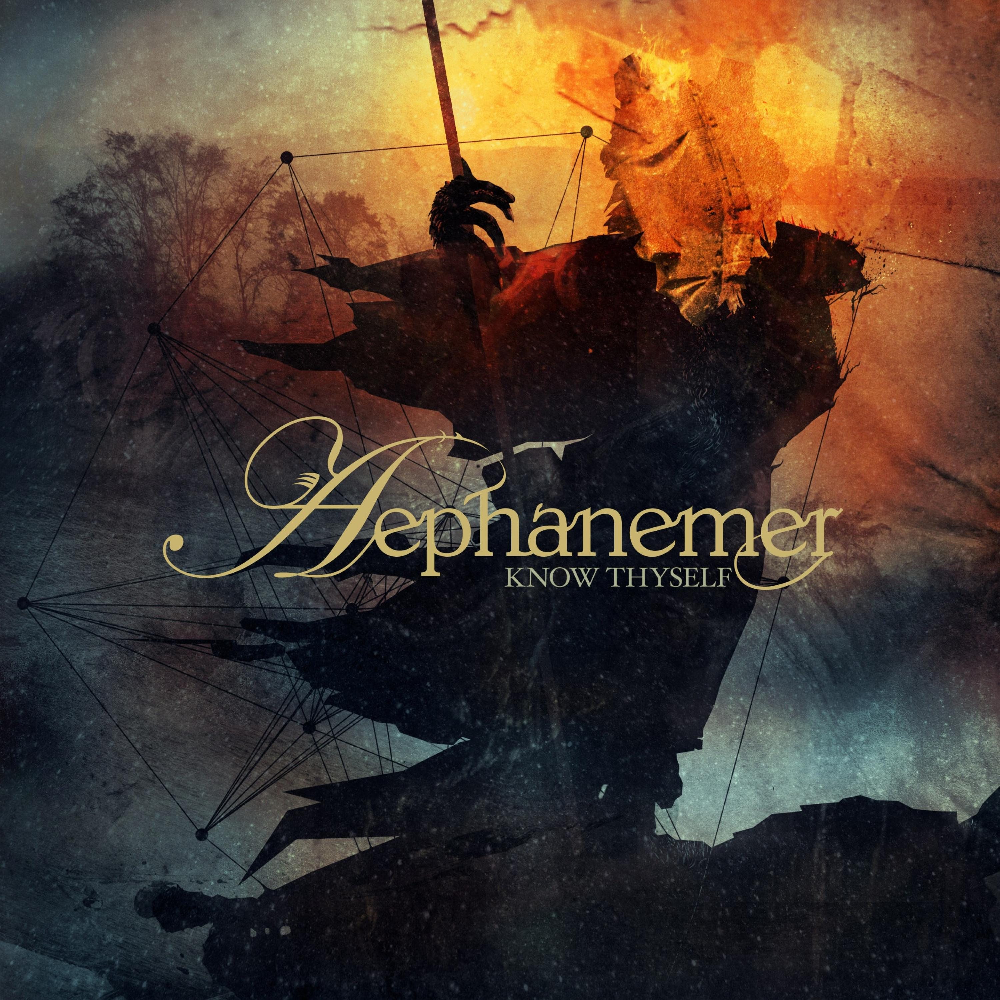

Saved embedded art to: /tmp/tmp1gpmggt4.jpeg


'image/jpeg'

In [ ]:
album_art.show_embedded_art(
    "NeuralForge/songs/Melodic Death Metal/Aephanemer - Path of the Wolf.mp3"
)
